In [ ]:
from typing import Any
import torch
from PIL import Image
from diffusers import FluxPipeline
from einops import rearrange
from autoencoder import TopkSparseAutoencoder
from pathlib import Path
import hashlib
import re
import random
import numpy as np


# ===== CONFIGURATION - Change these to create different test runs =====
FLUX_MODEL = "black-forest-labs/FLUX.1-schnell"  # or "black-forest-labs/FLUX.1-dev"
# FLUX_MODEL = "black-forest-labs/FLUX.1-dev"
SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.0-0" # MMDiT layer 0, text stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.0-1" # MMDiT layer 0, image stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.18-0" # MMDiT layer 18, text stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.18-1" # MMDiT layer 18, image stream
# SAE_MODEL = "RE-N-Y/cc3m-single_transformer_blocks.9" # DiT layer 9, text/image stream
# SAE_MODEL = "RE-N-Y/cc3m-single_transformer_blocks.37" # DiT layer 9, text/image stream

# Your prompt
prompt = "a woman with pink hair standing in a dark room (no light), holding a sign that says `SAE test ' (no light, regular paper sign), an apple is floating in the air at the [25,50] pixel of the image"
# prompt = "a woman with pink hair standing in a forest, holding a sign"
# prompt = "a woman with pink hair standing in a forest, holding a sign that says ‘Skipping flux blocks‘"
# prompt = "a woman with pink hair standing in a dark room, holding a sign that says `SAE test ‘, behind her left is a blue light, right is a red light"
# prompt = "a woman with pink hair standing in a dark room, holding a sign that says `SAE test ‘ (no light, regular paper sign), behind her a blue light is shine from 45 deg from top left, a red light is shine from 45 deg from bottom right"
# prompt = "a woman with pink hair standing in a dark room (no light), holding a sign that says `SAE test ‘ (no light, regular paper sign), an apple is floating in the air at the [25,50] pixel of the image"

# test_strengths = [1.1, 5.0, 10.0, 20.0, 50.0]  # Adjust as needed
# For Gytis-style steering, use lower strengths (0.1-5.0)
# For CLIP embeddings (Gytis's case), strength=40 works because CLIP embeddings are normalized differently
# For FLUX internal activations, use much lower strengths

# test_strengths = np.arange(0.5, 2.5, 0.5).tolist() 
test_strengths = np.arange(0.0, 500, 100.0).tolist() 

test_strengths.append(-100)
test_strengths = sorted(test_strengths)
print(test_strengths)

# ===== CREATE OUTPUT FOLDER BASED ON TEST CONFIGURATION =====
# Create folder name from configuration
prompt_hash = hashlib.md5(prompt.encode()).hexdigest()[:8]  # Short hash of prompt
flux_model_name = FLUX_MODEL.split("/")[-1].replace(".", "-")  # e.g., "FLUX-1-schnell"
strength_str = f"strengths-{min(test_strengths)}-to-{max(test_strengths)}"
sae_suffix = "-".join(SAE_MODEL.split("/")[-1].split("-")[-2:])  # e.g., "blocks.0-1" or "blocks.0-0"

# Steering methods:
# - "error_preserving": CLIP-style with reconstruction error (preserves lost information)
# - "gytis_style": Only boosts features in top-k (default, less disruptive)
# - "additive": Direct feature direction addition (fastest, less precise)
# - "surgery": Original full encode-decode (most disruptive)


# steering_method = "gytis_style"  # Default: only boosts active features
# steering_method = "error_preserving"  # Recommended: preserves reconstruction error (like CLIP method)
# steering_method = "additive"  # Alternative: direct feature direction addition
steering_method = "surgery"  # Original: forces activation (more disruptive)
# test_strengths defined at top of cell (in CONFIGURATION section)

output_folder = f"steering_test_{flux_model_name}_{sae_suffix}_{steering_method}_{prompt_hash}_{strength_str}"

# Create output directory and folder in ./output/
output_base = Path("./output")
output_base.mkdir(parents=True, exist_ok=True)
output_path = output_base / output_folder
output_path.mkdir(parents=True, exist_ok=True)

print(f"📁 Output folder: {output_path}/")
print(f"   All images will be saved here")
print(f"   Config: FLUX={flux_model_name}, prompt_hash={prompt_hash}, strengths={test_strengths}")

# ===== LOAD MODELS =====
flux_sae = TopkSparseAutoencoder.from_pretrained(SAE_MODEL)

# Load FLUX pipeline
pipe = FluxPipeline.from_pretrained(
    FLUX_MODEL,
    torch_dtype=torch.bfloat16
)
pipe = pipe.to("cuda")

# Configuration for the SAE (supports both "transformer_blocks.X-Y" and "single_transformer_blocks.X")
sae_match = re.search(r"(?:transformer_blocks|single_transformer_blocks)\.(\d+)(?:-\d+)?", SAE_MODEL)
if sae_match:
    block_num = sae_match.group(1)
    if "single_transformer_blocks" in SAE_MODEL:
        hook_location = f"single_transformer_blocks.{block_num}.attn"
    else:
        hook_location = f"transformer_blocks.{block_num}.attn"
else:
    # Fallback/default in case SAE_MODEL pattern is different
    hook_location = "transformer_blocks.0.attn"

# Autodetect stream from SAE_MODEL name; if "-1" at end, use stream=1 (key), else stream=0 (query)
sae_stream_match = re.search(r'transformer_blocks\.\d+-(\d)$', SAE_MODEL)
if sae_stream_match:
    stream = int(sae_stream_match.group(1))
else:
    stream = 0  # Default fallback to query stream

print(f"🔎 Using SAE hook location: {hook_location}")
print(f"🔎 Stream (0=query, 1=key): {stream}")

device = "cuda"
generator = torch.Generator(device=device).manual_seed(42)

# ===== ORIGINAL GENERATION (No steering) =====
print("Generating original image...")
original_image = pipe(
    prompt=prompt,
    height=512,
    width=512,
    num_inference_steps=4,
    guidance_scale=3.5,
    generator=generator,
).images[0]
original_image.save(output_path / "flux_original.png")
print(f"Original image saved to {output_path}/flux_original.png")

# Move SAE to GPU for faster processing and set to eval mode
flux_sae = flux_sae.to(device)
flux_sae.eval()  # Important: SAE should be in eval mode for inference

# ===== SAE STEERING: Increase a specific feature =====
# Method 1: Full encode-decode surgery (can introduce reconstruction error)

# def create_surgery_hook(sae, feature_idx, strength, stream=0, method="additive"):
#     """
#     Create a hook that applies SAE steering to modify activations.
    
#     Args:
#         sae: The TopK SAE model
#         feature_idx: Index of feature to boost (0 to pages-1)
#         strength: How much to boost the feature (use 0.1-2.0 for FLUX, not 5.0+)
#         stream: Which stream to modify (0=query, 1=key) for transformer_blocks.0.attn
#         method: "additive" (add feature direction) or "surgery" (full encode-decode)
#     """
#     def hook_fn(module, input, output):
#         # transformer_blocks.0.attn returns tuple (query, key)
#         if isinstance(output, tuple):
#             query, key = output
#             # Select which stream to modify based on stream parameter
#             target = query if stream == 0 else key
#             other = key if stream == 0 else query
            
#             # Reshape to flatten spatial dimensions: (batch, seq, height, width, dim) -> (batch*seq*h*w, dim)
#             original_shape = target.shape
#             target_flat = rearrange(target, "b ... d -> (b ...) d")
            
#             # Ensure input dtype matches SAE weights (handle bfloat16 from FLUX)
#             sae_dtype = next(sae.parameters()).dtype
#             original_dtype = target_flat.dtype
#             if target_flat.dtype != sae_dtype:
#                 target_flat = target_flat.to(sae_dtype)
            
#             # Ensure SAE and input are on same device
#             sae_device = next(sae.parameters()).device
#             if target_flat.device != sae_device:
#                 target_flat = target_flat.to(sae_device)
            
#             # Apply steering
#             with torch.no_grad():  # Steering doesn't need gradients
#                 if method == "additive":
#                     # METHOD 1: Additive steering - add feature direction directly (less noisy)
#                     # Get the decoder weight for this feature (represents the feature direction)
#                     feature_direction = sae.decoder.weight[:, feature_idx]  # Shape: (features,)
#                     # Add scaled feature direction to activations
#                     target_steered = target_flat + strength * feature_direction.unsqueeze(0)
#                 else:
#                     # METHOD 2: Full surgery - encode, modify, decode (more reconstruction error)
#                     target_steered = sae.surgery(target_flat, k=feature_idx, strength=strength)
            
#             # Convert back to original dtype and device
#             target_steered = target_steered.to(dtype=original_dtype, device=target.device)
            
#             # Reshape back to original shape
#             target_reshaped = target_steered.reshape(original_shape)
            
#             # Return modified output (target stream modified, other stream unchanged)
#             return (target_reshaped, other) if stream == 0 else (other, target_reshaped)
#         else:
#             # If not a tuple, just apply steering directly
#             original_shape = output.shape
#             output_flat = rearrange(output, "b ... d -> (b ...) d")
            
#             # Ensure input dtype matches SAE weights
#             sae_dtype = next(sae.parameters()).dtype
#             original_dtype = output_flat.dtype
#             if output_flat.dtype != sae_dtype:
#                 output_flat = output_flat.to(sae_dtype)
            
#             # Ensure SAE and input are on same device
#             sae_device = next(sae.parameters()).device
#             if output_flat.device != sae_device:
#                 output_flat = output_flat.to(sae_device)
            
#             with torch.no_grad():
#                 if method == "additive":
#                     # Additive steering
#                     feature_direction = sae.decoder.weight[:, feature_idx]
#                     output_steered = output_flat + strength * feature_direction.unsqueeze(0)
#                 else:
#                     # Full surgery
#                     output_steered = sae.surgery(output_flat, k=feature_idx, strength=strength)
            
#             # Convert back to original dtype and device
#             output_steered = output_steered.to(dtype=original_dtype, device=output.device)
            
#             # Reshape back to original shape
#             output_reshaped = output_steered.reshape(original_shape)
#             return output_reshaped
    
#     return hook_fn
    
def create_surgery_hook(sae, feature_idx, strength, stream=0, method="gytis_style"):
    """
    Create a hook for SAE steering.
    
    Methods:
    - "error_preserving": CLIP-style with reconstruction error preservation (recommended)
    - "gytis_style": Only boosts features in top-k (default)
    - "additive": Direct feature direction addition
    - "surgery": Original full encode-decode surgery
    """
    def hook_fn(module, input, output):
        if isinstance(output, tuple):
            query, key = output
            target = query if stream == 0 else key
            other = key if stream == 0 else query
            
            original_shape = target.shape
            target_flat = rearrange(target, "b ... d -> (b ...) d")
            
            # Ensure dtype/device match
            sae_dtype = next(sae.parameters()).dtype
            sae_device = next(sae.parameters()).device
            target_flat = target_flat.to(dtype=sae_dtype, device=sae_device)
            
            # Use Gytis-style surgery
            with torch.no_grad():
                if method == "error_preserving":
                    # CLIP-style: preserve reconstruction error
                    target_steered = sae.surgery_with_error_preservation(
                        target_flat, 
                        k=feature_idx, 
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "gytis_style":
                    target_steered = sae.surgery_gytis_style(
                        target_flat, 
                        k=feature_idx, 
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "additive":
                    feature_direction = sae.decoder.weight[:, feature_idx]
                    target_steered = target_flat + strength * feature_direction.unsqueeze(0)
                else:  # original surgery
                    target_steered = sae.surgery(target_flat, k=feature_idx, strength=strength)
            
            # Convert back
            target_steered = target_steered.to(dtype=target.dtype, device=target.device)
            target_reshaped = target_steered.reshape(original_shape)
            
            return (target_reshaped, other) if stream == 0 else (other, target_reshaped)
        else:
            # Handle non-tuple output similarly
            original_shape = output.shape
            output_flat = rearrange(output, "b ... d -> (b ...) d")
            
            # Ensure input dtype matches SAE weights
            sae_dtype = next(sae.parameters()).dtype
            original_dtype = output_flat.dtype
            if output_flat.dtype != sae_dtype:
                output_flat = output_flat.to(sae_dtype)
            
            # Ensure SAE and input are on same device
            sae_device = next(sae.parameters()).device
            if output_flat.device != sae_device:
                output_flat = output_flat.to(sae_device)
            
            with torch.no_grad():
                if method == "error_preserving":
                    # CLIP-style: preserve reconstruction error
                    output_steered = sae.surgery_with_error_preservation(
                        output_flat,
                        k=feature_idx,
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "gytis_style":
                    output_steered = sae.surgery_gytis_style(
                        output_flat,
                        k=feature_idx,
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "additive":
                    # Additive steering
                    feature_direction = sae.decoder.weight[:, feature_idx]
                    output_steered = output_flat + strength * feature_direction.unsqueeze(0)
                else:  # original surgery
                    output_steered = sae.surgery(output_flat, k=feature_idx, strength=strength)
            
            # Convert back to original dtype and device
            output_steered = output_steered.to(dtype=original_dtype, device=output.device)
            
            # Reshape back to original shape
            output_reshaped = output_steered.reshape(original_shape)
            return output_reshaped
    
    return hook_fn

# Try steering with different features and strengths

# First, run analysis to find top features (see below), then use those
# For now, test with a few features
test_features = random.sample(range(49152), 3)  # Randomly select 3 features from feature indices 0 to 49151


for feature_idx in test_features:
    # for strength in [0.5, 1.0]:  # Test with moderate strengths first
    for strength in test_strengths:  # Start with small strengths
        print(f"\nSteering with feature {feature_idx}, strength {strength}, method={steering_method}...")
        
        # Register hook for this feature
        hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(
            create_surgery_hook(flux_sae, feature_idx=feature_idx, strength=strength, 
                              stream=stream, method=steering_method)
        )
    
    try:
        # Generate image with steering
        steered_image = pipe(
            prompt=prompt,
            height=512,
            width=512,
            num_inference_steps=4,
            guidance_scale=3.5,
            generator=torch.Generator(device=device).manual_seed(42),  # Same seed for comparison
        ).images[0]
        
        steered_image.save(output_path / f"flux_steered_feature_{feature_idx}_strength_{strength}.png")
        print(f"Steered image saved to {output_path}/flux_steered_feature_{feature_idx}_strength_{strength}.png")
    finally:
        # Always remove hook to avoid memory leaks
        hook_handle.remove()

# ===== EXPLORE FEATURE ACTIVATIONS =====
print("\nAnalyzing feature activations...")

# Extract activations to see which features activate for this prompt
activation_hook_output = None

def activation_hook(module, input, output):
    global activation_hook_output
    if isinstance(output, tuple):
        query, key = output
        activation_hook_output = query if stream == 0 else key
    else:
        activation_hook_output = output
    return output

hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(activation_hook)

# Generate once to capture activations
_ = pipe(
    prompt=prompt,
    height=512,
    width=512,
    num_inference_steps=1,  # Just 1 step to get activations
    guidance_scale=3.5,
    generator=torch.Generator(device=device).manual_seed(42),
)

hook_handle.remove()

if activation_hook_output is not None:
    # Flatten and encode
    activations_flat = rearrange(activation_hook_output, "b ... d -> (b ...) d")
    feature_activations = flux_sae.encode(activations_flat)  # Shape: (batch*seq, num_features)
    
    # Find top activating features
    feature_sums = feature_activations.abs().sum(dim=0)  # Sum across all tokens
    top_features, top_indices = torch.topk(feature_sums, k=10)
    
    print("\nTop 10 activating features:")
    for i, (feat_idx, feat_act) in enumerate(zip(top_indices.cpu().tolist(), top_features.cpu().tolist())):
        print(f"  Feature {feat_idx}: total activation = {feat_act:.2f}")
    
    print(f"\nTry steering with these top features to see their effects!")
    print("Example: Use feature_idx={} in the steering loop above".format(top_indices[0].item()))
    
    # ===== OPTIONAL: Test steering with top features =====
    print("\n" + "="*60)
    print("Testing steering with TOP activating features...")
    print("="*60)
    
    # Use top 3 features with additive method (less noisy)
    top_features_to_test = top_indices[:3].cpu().tolist()
    
    for feat_idx in top_features_to_test:
        for strength in test_strengths: 
            print(f"\nSteering top feature {feat_idx} with strength {strength} (additive)...")
            
            hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(
                create_surgery_hook(flux_sae, feature_idx=feat_idx, strength=strength,
                                  stream=stream, method="additive")
            )
            try:
                steered_image = pipe(
                    prompt=prompt,
                    height=512,
                    width=512,
                    num_inference_steps=4,
                    guidance_scale=3.5,
                    generator=torch.Generator(device=device).manual_seed(42),
                ).images[0]
                
                steered_image.save(output_path / f"flux_top_feature_{feat_idx}_strength_{strength}.png")
                print(f"  Saved: {output_path}/flux_top_feature_{feat_idx}_strength_{strength}.png")
            finally:
                hook_handle.remove()


[-100, 0.0, 100.0, 200.0, 300.0, 400.0]
📁 Output folder: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/
   All images will be saved here
   Config: FLUX=FLUX-1-schnell, prompt_hash=16014404, strengths=[-100, 0.0, 100.0, 200.0, 300.0, 400.0]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

🔎 Using SAE hook location: transformer_blocks.0.attn
🔎 Stream (0=query, 1=key): 0
Generating original image...


  0%|          | 0/4 [00:00<?, ?it/s]

Original image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_original.png

Steering with feature 39226, strength -100, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_39226_strength_-100.png

Steering with feature 39226, strength 0.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_39226_strength_0.0.png

Steering with feature 39226, strength 100.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_39226_strength_100.0.png

Steering with feature 39226, strength 200.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_39226_strength_200.0.png

Steering with feature 39226, strength 300.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_39226_strength_300.0.png

Steering with feature 39226, strength 400.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_39226_strength_400.0.png

Steering with feature 38707, strength -100, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_38707_strength_-100.png

Steering with feature 38707, strength 0.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_38707_strength_0.0.png

Steering with feature 38707, strength 100.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_38707_strength_100.0.png

Steering with feature 38707, strength 200.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_38707_strength_200.0.png

Steering with feature 38707, strength 300.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_38707_strength_300.0.png

Steering with feature 38707, strength 400.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_38707_strength_400.0.png

Steering with feature 41608, strength -100, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_41608_strength_-100.png

Steering with feature 41608, strength 0.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_41608_strength_0.0.png

Steering with feature 41608, strength 100.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_41608_strength_100.0.png

Steering with feature 41608, strength 200.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_41608_strength_200.0.png

Steering with feature 41608, strength 300.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_41608_strength_300.0.png

Steering with feature 41608, strength 400.0, method=surgery...


  0%|          | 0/4 [00:00<?, ?it/s]

Steered image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steered_feature_41608_strength_400.0.png

Analyzing feature activations...


  0%|          | 0/1 [00:00<?, ?it/s]


Top 10 activating features:
  Feature 31925: total activation = 2479.31
  Feature 25140: total activation = 2030.31
  Feature 30248: total activation = 1997.21
  Feature 14705: total activation = 1978.28
  Feature 21487: total activation = 1945.06
  Feature 38412: total activation = 1896.89
  Feature 6031: total activation = 1816.34
  Feature 25811: total activation = 1738.21
  Feature 36760: total activation = 1701.85
  Feature 4426: total activation = 1642.35

Try steering with these top features to see their effects!
Example: Use feature_idx=31925 in the steering loop above

Testing steering with TOP activating features...

Steering top feature 31925 with strength -100 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_31925_strength_-100.png

Steering top feature 31925 with strength 0.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_31925_strength_0.0.png

Steering top feature 31925 with strength 100.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_31925_strength_100.0.png

Steering top feature 31925 with strength 200.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_31925_strength_200.0.png

Steering top feature 31925 with strength 300.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_31925_strength_300.0.png

Steering top feature 31925 with strength 400.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_31925_strength_400.0.png

Steering top feature 25140 with strength -100 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_25140_strength_-100.png

Steering top feature 25140 with strength 0.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_25140_strength_0.0.png

Steering top feature 25140 with strength 100.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_25140_strength_100.0.png

Steering top feature 25140 with strength 200.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_25140_strength_200.0.png

Steering top feature 25140 with strength 300.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_25140_strength_300.0.png

Steering top feature 25140 with strength 400.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_25140_strength_400.0.png

Steering top feature 30248 with strength -100 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_30248_strength_-100.png

Steering top feature 30248 with strength 0.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_30248_strength_0.0.png

Steering top feature 30248 with strength 100.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_30248_strength_100.0.png

Steering top feature 30248 with strength 200.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_30248_strength_200.0.png

Steering top feature 30248 with strength 300.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_30248_strength_300.0.png

Steering top feature 30248 with strength 400.0 (additive)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_top_feature_30248_strength_400.0.png


Using folder from previous cell: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0
Found 58 generated images in output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/


/tmp/ipykernel_125407/3422753508.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.98])  # Leave small space for suptitle



✅ Comparison grid saved to: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0/flux_steering_comparison.png
   Displaying 58 images in 15x4 grid


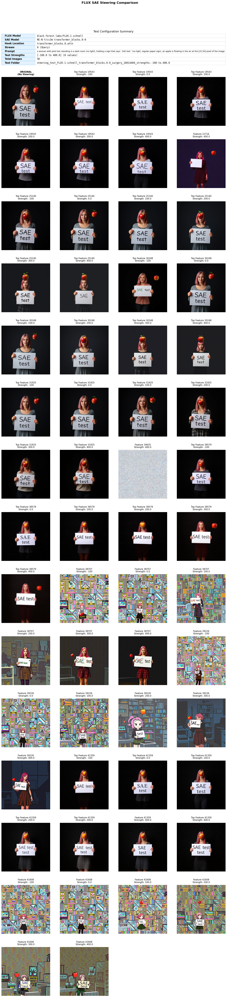

In [7]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from PIL import Image
import glob
import re

# ===== CONFIGURATION - Specify which test folder to visualize =====
# Option 1: Use the folder from the previous cell (if output_path variable exists)
try:
    # Try output_path first (it's a Path object)
    if 'output_path' in locals() or 'output_path' in globals():
        folder_path = output_path
        visualize_folder = output_path.name
        print(f"Using folder from previous cell: {folder_path}")
    else:
        raise NameError
except NameError:
    # Option 2: Specify folder manually, or use most recent
    visualize_folder = None  # Set to folder name if you want to load a specific test
    
    # Option 3: Find most recent folder in ./output/
    output_base = Path("./output")
    if output_base.exists():
        test_folders = sorted(output_base.glob("steering_test_*"), key=lambda x: x.stat().st_mtime, reverse=True)
        if test_folders:
            folder_path = test_folders[0]
            visualize_folder = folder_path.name
            print(f"Using most recent folder in ./output/: {folder_path}")
        else:
            print("No test folders found in ./output/! Run the steering cell first.")
            folder_path = None
    else:
        print("Output directory ./output/ not found! Run the steering cell first.")
        folder_path = None

if folder_path and folder_path.exists():
    # Find all generated images in the specified folder
    image_files = sorted(glob.glob(str(folder_path / "flux_*.png")))
    # Drop the file 'flux_steering_comparison.png' from the list if present
    image_files = [f for f in image_files if not f.endswith('flux_steering_comparison.png')]
    print(f"Found {len(image_files)} generated images in {folder_path}/")
    
    # ===== EXTRACT CONFIGURATION FROM FOLDER NAME OR GLOBAL SCOPE =====
    config_info = {}
    
    # Try to get from global scope first (more accurate)
    # Use get_ipython().user_ns to access variables from previous cells in Jupyter
    try:
        import __main__
        namespace = __main__.__dict__
    except:
        namespace = globals()
    
    # Try to get variables from namespace
    if 'FLUX_MODEL' in namespace:
        config_info['FLUX Model'] = namespace['FLUX_MODEL']
    elif 'FLUX_MODEL' in globals():
        config_info['FLUX Model'] = globals()['FLUX_MODEL']
    
    if 'SAE_MODEL' in namespace:
        config_info['SAE Model'] = namespace['SAE_MODEL']
    elif 'SAE_MODEL' in globals():
        config_info['SAE Model'] = globals()['SAE_MODEL']
    
    if 'prompt' in namespace:
        config_info['Prompt'] = namespace['prompt']
    elif 'prompt' in globals():
        config_info['Prompt'] = globals()['prompt']
    
    if 'test_strengths' in namespace:
        config_info['Test Strengths'] = namespace['test_strengths']
    elif 'test_strengths' in globals():
        config_info['Test Strengths'] = globals()['test_strengths']
    
    if 'hook_location' in namespace:
        config_info['Hook Location'] = namespace['hook_location']
    elif 'hook_location' in globals():
        config_info['Hook Location'] = globals()['hook_location']
    
    if 'stream' in namespace:
        config_info['Stream'] = namespace['stream']
    elif 'stream' in globals():
        config_info['Stream'] = globals()['stream']
    
    # Parse folder name as fallback
    folder_name = folder_path.name if hasattr(folder_path, 'name') else str(folder_path)
    if 'steering_test_' in folder_name:
        # Extract model name (e.g., FLUX-1-dev -> FLUX.1-dev)
        if 'FLUX Model' not in config_info or not config_info['FLUX Model']:
            model_match = re.search(r'(FLUX-[^-]+-[^-]+)', folder_name)
            if model_match:
                config_info['FLUX Model'] = model_match.group(1).replace('-', '.')
        
        # Extract SAE location (e.g., transformer_blocks.0-0)
        if 'SAE Model' not in config_info or not config_info['SAE Model']:
            sae_match = re.search(r'(transformer_blocks\.\d+-\d+|single_transformer_blocks\.\d+)', folder_name)
            if sae_match:
                config_info['SAE Model'] = sae_match.group(1)
        
        # Extract strength range
        if 'Test Strengths' not in config_info or not config_info['Test Strengths']:
            strength_match = re.search(r'strengths-([\d.]+)-to-([\d.]+)', folder_name)
            if strength_match:
                min_str = float(strength_match.group(1))
                max_str = float(strength_match.group(2))
                config_info['Test Strengths'] = f"{min_str} to {max_str}"
else:
    image_files = []
    print("No folder specified or found.")
    config_info = {}

if len(image_files) == 0:
    print("No images found! Run the steering cell first.")
else:
    # Separate original from steered
    original_files = [f for f in image_files if "original" in f]
    steered_files = [f for f in image_files if "original" not in f]
    
    # Sort steered files by feature and strength
    def sort_key(f):
        """Sort by: feature_idx, then strength"""
        name = Path(f).stem
        try:
            # Extract feature index and strength
            parts = name.split("_")
            feat_idx = None
            strength = None
            for i, part in enumerate(parts):
                if part == "feature" and i+1 < len(parts):
                    try:
                        feat_idx = int(parts[i+1])
                    except:
                        pass
                if part == "strength" and i+1 < len(parts):
                    try:
                        strength = float(parts[i+1])
                    except:
                        pass
            return (feat_idx or 999999, strength or 0)
        except:
            return (999999, 0)
    
    # Organize: original first, then steered sorted by feature/strength
    all_files = sorted(original_files) + sorted(steered_files, key=sort_key)
    
    # Create figure with dynamic layout
    n_images = len(all_files)
    cols = 4  # Number of columns
    rows = (n_images + cols - 1) // cols  # Calculate rows needed
    
    # Add extra row for summary table at top
    # Increase figure height to accommodate taller table
    fig = plt.figure(figsize=(20, 5 * rows + 2.5))
    # Increase height ratio for table to make it taller
    # Reduce hspace to minimize gap between table and images
    gs = gridspec.GridSpec(rows + 1, cols, figure=fig, hspace=0.15, wspace=0.2, 
                           height_ratios=[0.6] + [1]*rows)  # Increased from 0.25 to 0.6 for taller table
    
    # ===== CREATE SUMMARY TABLE AT TOP =====
    ax_table = fig.add_subplot(gs[0, :])
    ax_table.axis('off')
    
    # Prepare table data
    table_data = []
    table_colors = []
    
    # Define fields to show (only include non-None values)
    fields = []
    if config_info.get('FLUX Model'):
        fields.append(('FLUX Model', config_info['FLUX Model']))
    if config_info.get('SAE Model'):
        fields.append(('SAE Model', config_info['SAE Model']))
    if config_info.get('Hook Location'):
        fields.append(('Hook Location', config_info['Hook Location']))
    if config_info.get('Stream') is not None:
        fields.append(('Stream', f"{config_info['Stream']} ({'Query' if config_info['Stream'] == 0 else 'Key'})"))
    
    # Add prompt (no wrapping - show full text)
    prompt_text = config_info.get('Prompt')
    if prompt_text:
        # Don't wrap - show full prompt text (we'll give it more column width)
        fields.append(('Prompt', prompt_text))
    
    # Add test strengths
    strengths = config_info.get('Test Strengths')
    if strengths:
        if isinstance(strengths, list):
            strengths_str = f"[{min(strengths):.1f} to {max(strengths):.1f}] ({len(strengths)} values)"
        else:
            strengths_str = str(strengths)
        fields.append(('Test Strengths', strengths_str))
    
    # Add image count (always show)
    fields.append(('Total Images', str(n_images)))
    
    # Add folder name for reference
    if visualize_folder:
        fields.append(('Test Folder', visualize_folder))
    
    # Create table only if we have fields to show
    if fields:
        for field_name, field_value in fields:
            table_data.append([field_name, str(field_value) if field_value else 'N/A'])
        
        # Make first column (headers) narrower, second column (values) wider
        # This gives more space for text content and prevents wrapping
        table = ax_table.table(cellText=table_data,
                               cellLoc='left',  # Left align both columns
                               colWidths=[0.15, 0.85],  # Wider value column: 15% header, 85% value
                               loc='center',
                               bbox=[0, 0.05, 1, 0.95])  # Leave small margins, don't use full height
        
        # Style table - increase height for better readability
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        # table.scale() controls spacing between cells and their size
        # Higher values make cells taller: (width_scale, height_scale)
        table.scale(1, 4.0)  # Significant vertical scale for taller cells
        
        # Alternative: Adjust individual cell heights programmatically if needed
        # This can help if scale() alone doesn't work
        
        # Style cells: bold headers with blue background, white values
        for i in range(len(table_data)):
            field_name = str(table_data[i][0])
            cell_value = str(table_data[i][1])
            is_prompt = 'Prompt' in field_name
            
            # Blue column (headers) - left aligned
            table[(i, 0)].set_text_props(weight='bold', fontsize=12)
            table[(i, 0)].get_text().set_ha('left')  # Left align text
            table[(i, 0)].set_facecolor('#e3f2fd')  # Light blue for headers
            table[(i, 0)].set_edgecolor('#90caf9')
            
            # White column (values) - explicitly set left alignment
            # For prompt cells, use sans-serif for better readability
            # With wider columns (85%), prompts should fit without wrapping
            if is_prompt:
                # Use sans-serif font for better readability of full prompt
                table[(i, 1)].set_text_props(fontsize=10, family='sans-serif')
            else:
                # Use monospace for other values
                table[(i, 1)].set_text_props(fontsize=12, family='monospace')
            
            # Explicitly set horizontal alignment to left for value column
            table[(i, 1)].get_text().set_ha('left')  # Force left alignment
            table[(i, 1)].set_facecolor('#ffffff')  # White for values
            table[(i, 1)].set_edgecolor('#e0e0e0')
            # Reduce padding to bring text closer to left edge
            table[(i, 1)].PAD = 0.01  # Minimal padding from left edge
            
            # Increase cell height by adjusting the row height in the table
            # This can help make cells taller if scale() isn't enough
            # Get current cell height and increase it
            current_height = table[(i, 1)].get_height()
            # Set minimum cell height - this ensures cells are tall enough
            table[(i, 1)].set_height(0.15)  # Explicitly set cell height
            table[(i, 0)].set_height(0.15)  # Match header height
        
        # Title for the table (reduce padding to minimize gap)
        ax_table.set_title('Test Configuration Summary', fontsize=14, pad=8)  # Increased from 13 to 14
    else:
        ax_table.text(0.5, 0.5, 'Configuration information not available', 
                     ha='center', va='center', fontsize=12, style='italic')
        ax_table.set_title('Test Configuration Summary', fontsize=14, pad=8)  # Increased from 13 to 14
    
    for idx, img_path in enumerate(all_files):
        # Start from row 1 (row 0 is for table)
        row = (idx // cols) + 1
        col = idx % cols
        ax = fig.add_subplot(gs[row, col])
        
        # Load and display image
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
        
        # Create title from filename
        name = Path(img_path).stem.replace("flux_", "")
        if "original" in name:
            title = "ORIGINAL\n(No Steering)"
            # Highlight original with green border
            for spine in ax.spines.values():
                spine.set_edgecolor('green')
                spine.set_linewidth(3)
            ax.set_facecolor('#e8f5e9')  # Light green background
        elif "top_feature" in name:
            # Format: top_feature_31925_strength_1.0
            parts = name.split("_")
            feat_idx = parts[2] if len(parts) > 2 else "?"
            strength = parts[4] if len(parts) > 4 else "?"
            title = f"Top Feature {feat_idx}\nStrength: {strength}"
            ax.set_facecolor('#e3f2fd')  # Light blue background
        elif "steered_feature" in name:
            # Format: steered_feature_100_strength_1.0
            parts = name.split("_")
            feat_idx = parts[2] if len(parts) > 2 else "?"
            strength = parts[4] if len(parts) > 4 else "?"
            title = f"Feature {feat_idx}\nStrength: {strength}"
        else:
            title = name.replace("_", " ").title()
        
        ax.set_title(title, fontsize=11, fontweight='bold' if "original" in name.lower() else 'normal',
                    pad=10)
    
    # Hide unused subplots
    for idx in range(n_images, rows * cols):
        row = (idx // cols) + 1  # Start from row 1 (row 0 is for table)
        col = idx % cols
        ax = fig.add_subplot(gs[row, col])
        ax.axis('off')
    
    # Position suptitle first, then adjust layout to minimize gap
    plt.suptitle('FLUX SAE Steering Comparison', 
                 fontsize=16, fontweight='bold', y=0.999)
    
    # Use tight_layout but with minimal top margin, then override with subplots_adjust
    plt.tight_layout(rect=[0, 0, 1, 0.98])  # Leave small space for suptitle
    # Override top margin to minimize gap between suptitle and table
    fig.subplots_adjust(top=0.97)  # This brings the grid closer to the suptitle
    
    # Save comparison in the same folder
    if folder_path and folder_path.exists():
        comparison_path = folder_path / 'flux_steering_comparison.png'
    else:
        comparison_path = Path('./output/flux_steering_comparison.png')
        comparison_path.parent.mkdir(parents=True, exist_ok=True)
    
    plt.savefig(comparison_path, dpi=150, bbox_inches='tight', facecolor='white')
    print(f"\n✅ Comparison grid saved to: {comparison_path}")
    print(f"   Displaying {n_images} images in {rows}x{cols} grid")
    plt.show()



In [ ]:
from typing import Any
import torch
from PIL import Image
from diffusers import FluxPipeline
from einops import rearrange
from autoencoder import TopkSparseAutoencoder
from pathlib import Path
import hashlib
import re
import random
import numpy as np


# ===== CONFIGURATION - Change these to create different test runs =====
FLUX_MODEL = "black-forest-labs/FLUX.1-schnell"  # or "black-forest-labs/FLUX.1-dev"
# FLUX_MODEL = "black-forest-labs/FLUX.1-dev"
SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.0-0" # MMDiT layer 0, text stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.0-1" # MMDiT layer 0, image stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.18-0" # MMDiT layer 18, text stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.18-1" # MMDiT layer 18, image stream
# SAE_MODEL = "RE-N-Y/cc3m-single_transformer_blocks.9" # DiT layer 9, text/image stream
# SAE_MODEL = "RE-N-Y/cc3m-single_transformer_blocks.37" # DiT layer 9, text/image stream

# Your prompt
prompt = "a woman with pink hair standing in a dark room (no light), holding a sign that says `SAE test ' (no light, regular paper sign), an apple is floating in the air at the [25,50] pixel of the image"
# prompt = "a woman with pink hair standing in a forest, holding a sign"
# prompt = "a woman with pink hair standing in a forest, holding a sign that says ‘Skipping flux blocks‘"
# prompt = "a woman with pink hair standing in a dark room, holding a sign that says `SAE test ‘, behind her left is a blue light, right is a red light"
# prompt = "a woman with pink hair standing in a dark room, holding a sign that says `SAE test ‘ (no light, regular paper sign), behind her a blue light is shine from 45 deg from top left, a red light is shine from 45 deg from bottom right"
# prompt = "a woman with pink hair standing in a dark room (no light), holding a sign that says `SAE test ‘ (no light, regular paper sign), an apple is floating in the air at the [25,50] pixel of the image"

# test_strengths = [1.1, 5.0, 10.0, 20.0, 50.0]  # Adjust as needed
# For Gytis-style steering, use lower strengths (0.1-5.0)
# For CLIP embeddings (Gytis's case), strength=40 works because CLIP embeddings are normalized differently
# For FLUX internal activations, use much lower strengths

# test_strengths = np.arange(0.5, 2.5, 0.5).tolist() 
test_strengths = np.arange(0.0, 500, 100.0).tolist() 

test_strengths.append(-100)
test_strengths = sorted(test_strengths)
print(test_strengths)

# ===== CREATE OUTPUT FOLDER BASED ON TEST CONFIGURATION =====
# Create folder name from configuration
prompt_hash = hashlib.md5(prompt.encode()).hexdigest()[:8]  # Short hash of prompt
flux_model_name = FLUX_MODEL.split("/")[-1].replace(".", "-")  # e.g., "FLUX-1-schnell"
strength_str = f"strengths-{min(test_strengths)}-to-{max(test_strengths)}"
sae_suffix = "-".join(SAE_MODEL.split("/")[-1].split("-")[-2:])  # e.g., "blocks.0-1" or "blocks.0-0"

# Steering methods:
# - "error_preserving": CLIP-style with reconstruction error (preserves lost information)
# - "gytis_style": Only boosts features in top-k (default, less disruptive)
# - "additive": Direct feature direction addition (fastest, less precise)
# - "surgery": Original full encode-decode (most disruptive)


# steering_method = "gytis_style"  # Default: only boosts active features
# steering_method = "error_preserving"  # Recommended: preserves reconstruction error (like CLIP method)
# steering_method = "additive"  # Alternative: direct feature direction addition
steering_method = "surgery"  # Original: forces activation (more disruptive)
# test_strengths defined at top of cell (in CONFIGURATION section)

output_folder = f"steering_test_{flux_model_name}_{sae_suffix}_{steering_method}_{prompt_hash}_{strength_str}"

# Create output directory and folder in ./output/
output_base = Path("./output")
output_base.mkdir(parents=True, exist_ok=True)
output_path = output_base / output_folder
output_path.mkdir(parents=True, exist_ok=True)

print(f"📁 Output folder: {output_path}/")
print(f"   All images will be saved here")
print(f"   Config: FLUX={flux_model_name}, prompt_hash={prompt_hash}, strengths={test_strengths}")

# ===== LOAD MODELS =====
flux_sae = TopkSparseAutoencoder.from_pretrained(SAE_MODEL)

# Load FLUX pipeline
pipe = FluxPipeline.from_pretrained(
    FLUX_MODEL,
    torch_dtype=torch.bfloat16
)
pipe = pipe.to("cuda")

# Configuration for the SAE (supports both "transformer_blocks.X-Y" and "single_transformer_blocks.X")
sae_match = re.search(r"(?:transformer_blocks|single_transformer_blocks)\.(\d+)(?:-\d+)?", SAE_MODEL)
if sae_match:
    block_num = sae_match.group(1)
    if "single_transformer_blocks" in SAE_MODEL:
        hook_location = f"single_transformer_blocks.{block_num}.attn"
    else:
        hook_location = f"transformer_blocks.{block_num}.attn"
else:
    # Fallback/default in case SAE_MODEL pattern is different
    hook_location = "transformer_blocks.0.attn"

# Autodetect stream from SAE_MODEL name; if "-1" at end, use stream=1 (key), else stream=0 (query)
sae_stream_match = re.search(r'transformer_blocks\.\d+-(\d)$', SAE_MODEL)
if sae_stream_match:
    stream = int(sae_stream_match.group(1))
else:
    stream = 0  # Default fallback to query stream

print(f"🔎 Using SAE hook location: {hook_location}")
print(f"🔎 Stream (0=query, 1=key): {stream}")

device = "cuda"
generator = torch.Generator(device=device).manual_seed(42)

# ===== ORIGINAL GENERATION (No steering) =====
print("Generating original image...")
original_image = pipe(
    prompt=prompt,
    height=512,
    width=512,
    num_inference_steps=4,
    guidance_scale=3.5,
    generator=generator,
).images[0]
original_image.save(output_path / "flux_original.png")
print(f"Original image saved to {output_path}/flux_original.png")

# Move SAE to GPU for faster processing and set to eval mode
flux_sae = flux_sae.to(device)
flux_sae.eval()  # Important: SAE should be in eval mode for inference

# ===== SAE STEERING: Increase a specific feature =====
# Method 1: Full encode-decode surgery (can introduce reconstruction error)

# def create_surgery_hook(sae, feature_idx, strength, stream=0, method="additive"):
#     """
#     Create a hook that applies SAE steering to modify activations.
    
#     Args:
#         sae: The TopK SAE model
#         feature_idx: Index of feature to boost (0 to pages-1)
#         strength: How much to boost the feature (use 0.1-2.0 for FLUX, not 5.0+)
#         stream: Which stream to modify (0=query, 1=key) for transformer_blocks.0.attn
#         method: "additive" (add feature direction) or "surgery" (full encode-decode)
#     """
#     def hook_fn(module, input, output):
#         # transformer_blocks.0.attn returns tuple (query, key)
#         if isinstance(output, tuple):
#             query, key = output
#             # Select which stream to modify based on stream parameter
#             target = query if stream == 0 else key
#             other = key if stream == 0 else query
            
#             # Reshape to flatten spatial dimensions: (batch, seq, height, width, dim) -> (batch*seq*h*w, dim)
#             original_shape = target.shape
#             target_flat = rearrange(target, "b ... d -> (b ...) d")
            
#             # Ensure input dtype matches SAE weights (handle bfloat16 from FLUX)
#             sae_dtype = next(sae.parameters()).dtype
#             original_dtype = target_flat.dtype
#             if target_flat.dtype != sae_dtype:
#                 target_flat = target_flat.to(sae_dtype)
            
#             # Ensure SAE and input are on same device
#             sae_device = next(sae.parameters()).device
#             if target_flat.device != sae_device:
#                 target_flat = target_flat.to(sae_device)
            
#             # Apply steering
#             with torch.no_grad():  # Steering doesn't need gradients
#                 if method == "additive":
#                     # METHOD 1: Additive steering - add feature direction directly (less noisy)
#                     # Get the decoder weight for this feature (represents the feature direction)
#                     feature_direction = sae.decoder.weight[:, feature_idx]  # Shape: (features,)
#                     # Add scaled feature direction to activations
#                     target_steered = target_flat + strength * feature_direction.unsqueeze(0)
#                 else:
#                     # METHOD 2: Full surgery - encode, modify, decode (more reconstruction error)
#                     target_steered = sae.surgery(target_flat, k=feature_idx, strength=strength)
            
#             # Convert back to original dtype and device
#             target_steered = target_steered.to(dtype=original_dtype, device=target.device)
            
#             # Reshape back to original shape
#             target_reshaped = target_steered.reshape(original_shape)
            
#             # Return modified output (target stream modified, other stream unchanged)
#             return (target_reshaped, other) if stream == 0 else (other, target_reshaped)
#         else:
#             # If not a tuple, just apply steering directly
#             original_shape = output.shape
#             output_flat = rearrange(output, "b ... d -> (b ...) d")
            
#             # Ensure input dtype matches SAE weights
#             sae_dtype = next(sae.parameters()).dtype
#             original_dtype = output_flat.dtype
#             if output_flat.dtype != sae_dtype:
#                 output_flat = output_flat.to(sae_dtype)
            
#             # Ensure SAE and input are on same device
#             sae_device = next(sae.parameters()).device
#             if output_flat.device != sae_device:
#                 output_flat = output_flat.to(sae_device)
            
#             with torch.no_grad():
#                 if method == "additive":
#                     # Additive steering
#                     feature_direction = sae.decoder.weight[:, feature_idx]
#                     output_steered = output_flat + strength * feature_direction.unsqueeze(0)
#                 else:
#                     # Full surgery
#                     output_steered = sae.surgery(output_flat, k=feature_idx, strength=strength)
            
#             # Convert back to original dtype and device
#             output_steered = output_steered.to(dtype=original_dtype, device=output.device)
            
#             # Reshape back to original shape
#             output_reshaped = output_steered.reshape(original_shape)
#             return output_reshaped
    
#     return hook_fn
    
def create_surgery_hook(sae, feature_idx, strength, stream=0, method="gytis_style", call_counter_ref=None):
    """
    Create a hook for SAE steering.
    
    IMPORTANT: SAE was trained on first timestep activations (num_inference_steps=1),
    so this hook only applies steering at step 0 (first timestep).
    
    Methods:
    - "error_preserving": CLIP-style with reconstruction error preservation (recommended)
    - "gytis_style": Only boosts features in top-k (default)
    - "additive": Direct feature direction addition
    - "surgery": Original full encode-decode surgery
    
    Args:
        call_counter_ref: A list containing the hook call counter [count]. 
                         Increments each time the hook is called. 
                         Only applies steering when count == 0 (first call = step 0).
    """
    def hook_fn(module, input, output):
        # Only apply SAE steering at step 0 (first timestep) since SAE was trained on first timestep
        # The hook is called once per denoising step, so we track calls to identify step 0
        if call_counter_ref is not None:
            call_count = call_counter_ref[0]
            call_counter_ref[0] += 1  # Increment for next call
            if call_count != 0:
                # Not at first timestep (first call), return output unchanged
                return output
        
        if isinstance(output, tuple):
            query, key = output
            target = query if stream == 0 else key
            other = key if stream == 0 else query
            
            original_shape = target.shape
            target_flat = rearrange(target, "b ... d -> (b ...) d")
            
            # Ensure dtype/device match
            sae_dtype = next(sae.parameters()).dtype
            sae_device = next(sae.parameters()).device
            target_flat = target_flat.to(dtype=sae_dtype, device=sae_device)
            
            # Use Gytis-style surgery
            with torch.no_grad():
                if method == "error_preserving":
                    # CLIP-style: preserve reconstruction error
                    target_steered = sae.surgery_with_error_preservation(
                        target_flat, 
                        k=feature_idx, 
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "gytis_style":
                    target_steered = sae.surgery_gytis_style(
                        target_flat, 
                        k=feature_idx, 
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "additive":
                    feature_direction = sae.decoder.weight[:, feature_idx]
                    target_steered = target_flat + strength * feature_direction.unsqueeze(0)
                else:  # original surgery
                    target_steered = sae.surgery(target_flat, k=feature_idx, strength=strength)
            
            # Convert back
            target_steered = target_steered.to(dtype=target.dtype, device=target.device)
            target_reshaped = target_steered.reshape(original_shape)
            
            return (target_reshaped, other) if stream == 0 else (other, target_reshaped)
        else:
            # Handle non-tuple output similarly
            original_shape = output.shape
            output_flat = rearrange(output, "b ... d -> (b ...) d")
            
            # Ensure input dtype matches SAE weights
            sae_dtype = next(sae.parameters()).dtype
            original_dtype = output_flat.dtype
            if output_flat.dtype != sae_dtype:
                output_flat = output_flat.to(sae_dtype)
            
            # Ensure SAE and input are on same device
            sae_device = next(sae.parameters()).device
            if output_flat.device != sae_device:
                output_flat = output_flat.to(sae_device)
            
            with torch.no_grad():
                if method == "error_preserving":
                    # CLIP-style: preserve reconstruction error
                    output_steered = sae.surgery_with_error_preservation(
                        output_flat,
                        k=feature_idx,
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "gytis_style":
                    output_steered = sae.surgery_gytis_style(
                        output_flat,
                        k=feature_idx,
                        strength=strength,
                        fallback_to_additive=True
                    )
                elif method == "additive":
                    # Additive steering
                    feature_direction = sae.decoder.weight[:, feature_idx]
                    output_steered = output_flat + strength * feature_direction.unsqueeze(0)
                else:  # original surgery
                    output_steered = sae.surgery(output_flat, k=feature_idx, strength=strength)
            
            # Convert back to original dtype and device
            output_steered = output_steered.to(dtype=original_dtype, device=output.device)
            
            # Reshape back to original shape
            output_reshaped = output_steered.reshape(original_shape)
            return output_reshaped
    
    return hook_fn

# Try steering with different features and strengths

# First, run analysis to find top features (see below), then use those
# For now, test with a few features
test_features = random.sample(range(49152), 3)  # Randomly select 3 features from feature indices 0 to 49151


for feature_idx in test_features:
    # for strength in [0.5, 1.0]:  # Test with moderate strengths first
    for strength in test_strengths:  # Start with small strengths
        print(f"\nSteering with feature {feature_idx}, strength {strength}, method={steering_method}...")
        
        # Track hook call count (hook is called once per denoising step)
        # SAE was trained on first timestep, so we only apply steering at step 0 (first call)
        call_counter = [0]  # Start at 0, increments each time hook is called
        
        # Register hook for this feature with call counter
        hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(
            create_surgery_hook(flux_sae, feature_idx=feature_idx, strength=strength, 
                              stream=stream, method=steering_method, call_counter_ref=call_counter)
        )
    
        try:
            # Generate image with steering
            # Reset call counter before generation
            call_counter[0] = 0
            steered_image = pipe(
                prompt=prompt,
                height=512,
                width=512,
                num_inference_steps=4,
                guidance_scale=3.5,
                generator=torch.Generator(device=device).manual_seed(42),  # Same seed for comparison
            ).images[0]
            
            steered_image.save(output_path / f"flux_steered_feature_{feature_idx}_strength_{strength}.png")
            print(f"Steered image saved to {output_path}/flux_steered_feature_{feature_idx}_strength_{strength}.png")
        finally:
            # Always remove hook to avoid memory leaks
            hook_handle.remove()

# ===== EXPLORE FEATURE ACTIVATIONS =====
print("\nAnalyzing feature activations...")

# Extract activations to see which features activate for this prompt
activation_hook_output = None

def activation_hook(module, input, output):
    global activation_hook_output
    if isinstance(output, tuple):
        query, key = output
        activation_hook_output = query if stream == 0 else key
    else:
        activation_hook_output = output
    return output

hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(activation_hook)

# Generate once to capture activations
_ = pipe(
    prompt=prompt,
    height=512,
    width=512,
    num_inference_steps=1,  # Just 1 step to get activations
    guidance_scale=3.5,
    generator=torch.Generator(device=device).manual_seed(42),
)

hook_handle.remove()

if activation_hook_output is not None:
    # Flatten and encode
    activations_flat = rearrange(activation_hook_output, "b ... d -> (b ...) d")
    feature_activations = flux_sae.encode(activations_flat)  # Shape: (batch*seq, num_features)
    
    # Find top activating features
    feature_sums = feature_activations.abs().sum(dim=0)  # Sum across all tokens
    top_features, top_indices = torch.topk(feature_sums, k=10)
    
    print("\nTop 10 activating features:")
    for i, (feat_idx, feat_act) in enumerate(zip(top_indices.cpu().tolist(), top_features.cpu().tolist())):
        print(f"  Feature {feat_idx}: total activation = {feat_act:.2f}")
    
    print(f"\nTry steering with these top features to see their effects!")
    print("Example: Use feature_idx={} in the steering loop above".format(top_indices[0].item()))
    
    # ===== OPTIONAL: Test steering with top features =====
    print("\n" + "="*60)
    print("Testing steering with TOP activating features...")
    print("="*60)
    
    # Use top 3 features with additive method (less noisy)
    top_features_to_test = top_indices[:3].cpu().tolist()
    
    for feat_idx in top_features_to_test:
        for strength in test_strengths: 
            print(f"\nSteering top feature {feat_idx} with strength {strength} (additive)...")
            
            # Track hook call count (hook is called once per denoising step)
            # SAE was trained on first timestep, so we only apply steering at step 0 (first call)
            call_counter = [0]  # Start at 0, increments each time hook is called
            
            hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(
                create_surgery_hook(flux_sae, feature_idx=feat_idx, strength=strength,
                                  stream=stream, method="additive", call_counter_ref=call_counter)
            )
            try:
                # Reset call counter before generation
                call_counter[0] = 0
                steered_image = pipe(
                    prompt=prompt,
                    height=512,
                    width=512,
                    num_inference_steps=4,
                    guidance_scale=3.5,
                    generator=torch.Generator(device=device).manual_seed(42),
                ).images[0]
                
                steered_image.save(output_path / f"flux_top_feature_{feat_idx}_strength_{strength}.png")
                print(f"  Saved: {output_path}/flux_top_feature_{feat_idx}_strength_{strength}.png")
            finally:
                hook_handle.remove()


In [8]:
from typing import Any
import torch
from PIL import Image
from diffusers import FluxPipeline
from einops import rearrange
from autoencoder import TopkSparseAutoencoder
from pathlib import Path
import hashlib
import re
import random
import numpy as np


# ===== CONFIGURATION - Change these to create different test runs =====
FLUX_MODEL = "black-forest-labs/FLUX.1-schnell"  # or "black-forest-labs/FLUX.1-dev"
# FLUX_MODEL = "black-forest-labs/FLUX.1-dev"
SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.0-0" # MMDiT layer 0, text stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.0-1" # MMDiT layer 0, image stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.18-0" # MMDiT layer 18, text stream
# SAE_MODEL = "RE-N-Y/cc3m-transformer_blocks.18-1" # MMDiT layer 18, image stream
# SAE_MODEL = "RE-N-Y/cc3m-single_transformer_blocks.9" # DiT layer 9, text/image stream
# SAE_MODEL = "RE-N-Y/cc3m-single_transformer_blocks.37" # DiT layer 9, text/image stream

# Your prompt
prompt = "a woman with pink hair standing in a dark room (no light), holding a sign that says `SAE test ' (no light, regular paper sign), an apple is floating in the air at the [25,50] pixel of the image"

# test_strengths = np.arange(0.5, 2.5, 0.5).tolist() 
test_strengths = np.arange(0.0, 500, 100.0).tolist() 
test_strengths.append(-100)
test_strengths = sorted(test_strengths)
print(test_strengths)

# ===== CREATE OUTPUT FOLDER BASED ON TEST CONFIGURATION =====
prompt_hash = hashlib.md5(prompt.encode()).hexdigest()[:8]
flux_model_name = FLUX_MODEL.split("/")[-1].replace(".", "-")
strength_str = f"strengths-{min(test_strengths)}-to-{max(test_strengths)}"
sae_suffix = "-".join(SAE_MODEL.split("/")[-1].split("-")[-2:])

# Steering methods:
# - "error_preserving": CLIP-style with reconstruction error (preserves lost information)
# - "gytis_style": Only boosts features in top-k (default, less disruptive)
# - "additive": Direct feature direction addition (fastest, less precise)
# - "surgery": Original full encode-decode (most disruptive)

steering_method = "surgery"  # Original: forces activation (more disruptive)

# Test both hook methods: "all_timesteps" vs "first_timestep_only"
hook_times = ["all_timesteps", "first_timestep_only"]

for hook_time in hook_times:
    output_folder = f"steering_test_{flux_model_name}_{sae_suffix}_{steering_method}_{prompt_hash}_{strength_str}_{hook_time}"
    
    # Create output directory and folder in ./output/
    output_base = Path("./output")
    output_base.mkdir(parents=True, exist_ok=True)
    output_path = output_base / output_folder
    output_path.mkdir(parents=True, exist_ok=True)
    
    print(f"\n{'='*70}")
    print(f"🎯 TESTING: hook_time={hook_time}")
    print(f"{'='*70}")
    print(f"📁 Output folder: {output_path}/")
    print(f"   Config: FLUX={flux_model_name}, prompt_hash={prompt_hash}, strengths={test_strengths}")
    
    # ===== LOAD MODELS =====
    flux_sae = TopkSparseAutoencoder.from_pretrained(SAE_MODEL)
    
    # Load FLUX pipeline
    pipe = FluxPipeline.from_pretrained(
        FLUX_MODEL,
        torch_dtype=torch.bfloat16
    )
    pipe = pipe.to("cuda")
    
    # Configuration for the SAE (supports both "transformer_blocks.X-Y" and "single_transformer_blocks.X")
    sae_match = re.search(r"(?:transformer_blocks|single_transformer_blocks)\.(\d+)(?:-\d+)?", SAE_MODEL)
    if sae_match:
        block_num = sae_match.group(1)
        if "single_transformer_blocks" in SAE_MODEL:
            hook_location = f"single_transformer_blocks.{block_num}.attn"
        else:
            hook_location = f"transformer_blocks.{block_num}.attn"
    else:
        hook_location = "transformer_blocks.0.attn"
    
    # Autodetect stream from SAE_MODEL name
    sae_stream_match = re.search(r'transformer_blocks\.\d+-(\d)$', SAE_MODEL)
    if sae_stream_match:
        stream = int(sae_stream_match.group(1))
    else:
        stream = 0
    
    print(f"🔎 Using SAE hook location: {hook_location}")
    print(f"🔎 Stream (0=query, 1=key): {stream}")
    print(f"🔎 Hook time method: {hook_time}")
    
    device = "cuda"
    generator = torch.Generator(device=device).manual_seed(42)
    
    # ===== ORIGINAL GENERATION (No steering) =====
    print("Generating original image...")
    original_image = pipe(
        prompt=prompt,
        height=512,
        width=512,
        num_inference_steps=4,
        guidance_scale=3.5,
        generator=generator,
    ).images[0]
    original_image.save(output_path / "flux_original.png")
    print(f"Original image saved to {output_path}/flux_original.png")
    
    # Move SAE to GPU for faster processing and set to eval mode
    flux_sae = flux_sae.to(device)
    flux_sae.eval()
    
    # ===== DEFINE STEERING HOOK WITH TIMESTEP CONTROL =====
    def create_surgery_hook(sae, feature_idx, strength, stream=0, method="gytis_style", 
                           hook_time="all_timesteps", call_counter_ref=None):
        """
        Create a hook for SAE steering with timestep control.
        
        Args:
            hook_time: "all_timesteps" - apply steering at all steps
                      "first_timestep_only" - apply steering only at step 0 (SAE training regime)
            call_counter_ref: List [count] for tracking hook calls when using first_timestep_only
        
        Methods:
        - "error_preserving": CLIP-style with reconstruction error preservation (recommended)
        - "gytis_style": Only boosts features in top-k (default)
        - "additive": Direct feature direction addition
        - "surgery": Original full encode-decode surgery
        """
        def hook_fn(module, input, output):
            # ===== TIMESTEP CONTROL =====
            if hook_time == "first_timestep_only":
                # Only apply SAE steering at step 0 (first timestep) since SAE was trained on first timestep
                if call_counter_ref is not None:
                    call_count = call_counter_ref[0]
                    call_counter_ref[0] += 1
                    if call_count != 0:
                        # Not at first timestep, return output unchanged
                        return output
            # else: "all_timesteps" - apply steering at all timesteps (no filtering)
            
            if isinstance(output, tuple):
                query, key = output
                target = query if stream == 0 else key
                other = key if stream == 0 else query
                
                original_shape = target.shape
                target_flat = rearrange(target, "b ... d -> (b ...) d")
                
                # Ensure dtype/device match
                sae_dtype = next(sae.parameters()).dtype
                sae_device = next(sae.parameters()).device
                target_flat = target_flat.to(dtype=sae_dtype, device=sae_device)
                
                # Apply steering
                with torch.no_grad():
                    if method == "error_preserving":
                        target_steered = sae.surgery_with_error_preservation(
                            target_flat, 
                            k=feature_idx, 
                            strength=strength,
                            fallback_to_additive=True
                        )
                    elif method == "gytis_style":
                        target_steered = sae.surgery_gytis_style(
                            target_flat, 
                            k=feature_idx, 
                            strength=strength,
                            fallback_to_additive=True
                        )
                    elif method == "additive":
                        feature_direction = sae.decoder.weight[:, feature_idx]
                        target_steered = target_flat + strength * feature_direction.unsqueeze(0)
                    else:  # original surgery
                        target_steered = sae.surgery(target_flat, k=feature_idx, strength=strength)
                
                # Convert back
                target_steered = target_steered.to(dtype=target.dtype, device=target.device)
                target_reshaped = target_steered.reshape(original_shape)
                
                return (target_reshaped, other) if stream == 0 else (other, target_reshaped)
            else:
                # Handle non-tuple output
                original_shape = output.shape
                output_flat = rearrange(output, "b ... d -> (b ...) d")
                
                # Ensure dtype/device match
                sae_dtype = next(sae.parameters()).dtype
                sae_device = next(sae.parameters()).device
                output_flat = output_flat.to(dtype=sae_dtype, device=sae_device)
                
                with torch.no_grad():
                    if method == "error_preserving":
                        output_steered = sae.surgery_with_error_preservation(
                            output_flat,
                            k=feature_idx,
                            strength=strength,
                            fallback_to_additive=True
                        )
                    elif method == "gytis_style":
                        output_steered = sae.surgery_gytis_style(
                            output_flat,
                            k=feature_idx,
                            strength=strength,
                            fallback_to_additive=True
                        )
                    elif method == "additive":
                        feature_direction = sae.decoder.weight[:, feature_idx]
                        output_steered = output_flat + strength * feature_direction.unsqueeze(0)
                    else:  # original surgery
                        output_steered = sae.surgery(output_flat, k=feature_idx, strength=strength)
                
                # Convert back
                output_steered = output_steered.to(dtype=output.dtype, device=output.device)
                output_reshaped = output_steered.reshape(original_shape)
                return output_reshaped
        
        return hook_fn
    
    # ===== SAE STEERING WITH TEST FEATURES =====
    test_features = random.sample(range(49152), 3)
    
    for feature_idx in test_features:
        for strength in test_strengths:
            print(f"\nSteering with feature {feature_idx}, strength {strength}, hook_time={hook_time}...")
            
            # Create call counter for timestep tracking
            call_counter = [0]
            
            # Register hook
            hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(
                create_surgery_hook(flux_sae, feature_idx=feature_idx, strength=strength, 
                                  stream=stream, method=steering_method, 
                                  hook_time=hook_time, call_counter_ref=call_counter)
            )
            
            try:
                # Reset call counter before generation
                call_counter[0] = 0
                steered_image = pipe(
                    prompt=prompt,
                    height=512,
                    width=512,
                    num_inference_steps=4,
                    guidance_scale=3.5,
                    generator=torch.Generator(device=device).manual_seed(42),
                ).images[0]
                
                steered_image.save(output_path / f"flux_steered_feature_{feature_idx}_strength_{strength}.png")
                print(f"  Saved: {output_path}/flux_steered_feature_{feature_idx}_strength_{strength}.png")
            finally:
                hook_handle.remove()
    
    # ===== EXPLORE FEATURE ACTIVATIONS =====
    print("\nAnalyzing feature activations...")
    
    activation_hook_output = None
    
    def activation_hook(module, input, output):
        global activation_hook_output
        if isinstance(output, tuple):
            query, key = output
            activation_hook_output = query if stream == 0 else key
        else:
            activation_hook_output = output
        return output
    
    hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(activation_hook)
    
    _ = pipe(
        prompt=prompt,
        height=512,
        width=512,
        num_inference_steps=1,
        guidance_scale=3.5,
        generator=torch.Generator(device=device).manual_seed(42),
    )
    
    hook_handle.remove()
    
    if activation_hook_output is not None:
        # Flatten and encode
        activations_flat = rearrange(activation_hook_output, "b ... d -> (b ...) d")
        feature_activations = flux_sae.encode(activations_flat)
        
        # Find top activating features
        feature_sums = feature_activations.abs().sum(dim=0)
        top_features, top_indices = torch.topk(feature_sums, k=10)
        
        print("\nTop 10 activating features:")
        for i, (feat_idx, feat_act) in enumerate(zip(top_indices.cpu().tolist(), top_features.cpu().tolist())):
            print(f"  Feature {feat_idx}: total activation = {feat_act:.2f}")
        
        # ===== TEST STEERING WITH TOP FEATURES =====
        print("\n" + "="*60)
        print(f"Testing steering with TOP activating features (hook_time={hook_time})...")
        print("="*60)
        
        top_features_to_test = top_indices[:3].cpu().tolist()
        
        for feat_idx in top_features_to_test:
            for strength in test_strengths:
                print(f"\nSteering top feature {feat_idx} with strength {strength} (additive, hook_time={hook_time})...")
                
                call_counter = [0]
                
                hook_handle = pipe.transformer.get_submodule(hook_location).register_forward_hook(
                    create_surgery_hook(flux_sae, feature_idx=feat_idx, strength=strength,
                                      stream=stream, method="additive", 
                                      hook_time=hook_time, call_counter_ref=call_counter)
                )
                try:
                    call_counter[0] = 0
                    steered_image = pipe(
                        prompt=prompt,
                        height=512,
                        width=512,
                        num_inference_steps=4,
                        guidance_scale=3.5,
                        generator=torch.Generator(device=device).manual_seed(42),
                    ).images[0]
                    
                    steered_image.save(output_path / f"flux_top_feature_{feat_idx}_strength_{strength}.png")
                    print(f"  Saved: {output_path}/flux_top_feature_{feat_idx}_strength_{strength}.png")
                finally:
                    hook_handle.remove()
    
    # Clean up for next iteration
    del pipe, flux_sae
    torch.cuda.empty_cache()

print("\n" + "="*70)
print("✅ All tests completed!")
print("="*70)

[-100, 0.0, 100.0, 200.0, 300.0, 400.0]

🎯 TESTING: hook_time=all_timesteps
📁 Output folder: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/
   Config: FLUX=FLUX-1-schnell, prompt_hash=16014404, strengths=[-100, 0.0, 100.0, 200.0, 300.0, 400.0]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

🔎 Using SAE hook location: transformer_blocks.0.attn
🔎 Stream (0=query, 1=key): 0
🔎 Hook time method: all_timesteps
Generating original image...


  0%|          | 0/4 [00:00<?, ?it/s]

Original image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_original.png

Steering with feature 21589, strength -100, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_21589_strength_-100.png

Steering with feature 21589, strength 0.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_21589_strength_0.0.png

Steering with feature 21589, strength 100.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_21589_strength_100.0.png

Steering with feature 21589, strength 200.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_21589_strength_200.0.png

Steering with feature 21589, strength 300.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_21589_strength_300.0.png

Steering with feature 21589, strength 400.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_21589_strength_400.0.png

Steering with feature 956, strength -100, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_956_strength_-100.png

Steering with feature 956, strength 0.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_956_strength_0.0.png

Steering with feature 956, strength 100.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_956_strength_100.0.png

Steering with feature 956, strength 200.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_956_strength_200.0.png

Steering with feature 956, strength 300.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_956_strength_300.0.png

Steering with feature 956, strength 400.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_956_strength_400.0.png

Steering with feature 259, strength -100, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_259_strength_-100.png

Steering with feature 259, strength 0.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_259_strength_0.0.png

Steering with feature 259, strength 100.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_259_strength_100.0.png

Steering with feature 259, strength 200.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_259_strength_200.0.png

Steering with feature 259, strength 300.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_259_strength_300.0.png

Steering with feature 259, strength 400.0, hook_time=all_timesteps...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_steered_feature_259_strength_400.0.png

Analyzing feature activations...


  0%|          | 0/1 [00:00<?, ?it/s]


Top 10 activating features:
  Feature 31925: total activation = 2479.31
  Feature 25140: total activation = 2030.31
  Feature 30248: total activation = 1997.21
  Feature 14705: total activation = 1978.28
  Feature 21487: total activation = 1945.06
  Feature 38412: total activation = 1896.89
  Feature 6031: total activation = 1816.34
  Feature 25811: total activation = 1738.21
  Feature 36760: total activation = 1701.85
  Feature 4426: total activation = 1642.35

Testing steering with TOP activating features (hook_time=all_timesteps)...

Steering top feature 31925 with strength -100 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_31925_strength_-100.png

Steering top feature 31925 with strength 0.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_31925_strength_0.0.png

Steering top feature 31925 with strength 100.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_31925_strength_100.0.png

Steering top feature 31925 with strength 200.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_31925_strength_200.0.png

Steering top feature 31925 with strength 300.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_31925_strength_300.0.png

Steering top feature 31925 with strength 400.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_31925_strength_400.0.png

Steering top feature 25140 with strength -100 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_25140_strength_-100.png

Steering top feature 25140 with strength 0.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_25140_strength_0.0.png

Steering top feature 25140 with strength 100.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_25140_strength_100.0.png

Steering top feature 25140 with strength 200.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_25140_strength_200.0.png

Steering top feature 25140 with strength 300.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_25140_strength_300.0.png

Steering top feature 25140 with strength 400.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_25140_strength_400.0.png

Steering top feature 30248 with strength -100 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_30248_strength_-100.png

Steering top feature 30248 with strength 0.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_30248_strength_0.0.png

Steering top feature 30248 with strength 100.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_30248_strength_100.0.png

Steering top feature 30248 with strength 200.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_30248_strength_200.0.png

Steering top feature 30248 with strength 300.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_30248_strength_300.0.png

Steering top feature 30248 with strength 400.0 (additive, hook_time=all_timesteps)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps/flux_top_feature_30248_strength_400.0.png

🎯 TESTING: hook_time=first_timestep_only
📁 Output folder: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/
   Config: FLUX=FLUX-1-schnell, prompt_hash=16014404, strengths=[-100, 0.0, 100.0, 200.0, 300.0, 400.0]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

🔎 Using SAE hook location: transformer_blocks.0.attn
🔎 Stream (0=query, 1=key): 0
🔎 Hook time method: first_timestep_only
Generating original image...


  0%|          | 0/4 [00:00<?, ?it/s]

Original image saved to output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_original.png

Steering with feature 27834, strength -100, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_27834_strength_-100.png

Steering with feature 27834, strength 0.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_27834_strength_0.0.png

Steering with feature 27834, strength 100.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_27834_strength_100.0.png

Steering with feature 27834, strength 200.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_27834_strength_200.0.png

Steering with feature 27834, strength 300.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_27834_strength_300.0.png

Steering with feature 27834, strength 400.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_27834_strength_400.0.png

Steering with feature 25350, strength -100, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_25350_strength_-100.png

Steering with feature 25350, strength 0.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_25350_strength_0.0.png

Steering with feature 25350, strength 100.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_25350_strength_100.0.png

Steering with feature 25350, strength 200.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_25350_strength_200.0.png

Steering with feature 25350, strength 300.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_25350_strength_300.0.png

Steering with feature 25350, strength 400.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_25350_strength_400.0.png

Steering with feature 20960, strength -100, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_20960_strength_-100.png

Steering with feature 20960, strength 0.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_20960_strength_0.0.png

Steering with feature 20960, strength 100.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_20960_strength_100.0.png

Steering with feature 20960, strength 200.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_20960_strength_200.0.png

Steering with feature 20960, strength 300.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_20960_strength_300.0.png

Steering with feature 20960, strength 400.0, hook_time=first_timestep_only...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_steered_feature_20960_strength_400.0.png

Analyzing feature activations...


  0%|          | 0/1 [00:00<?, ?it/s]


Top 10 activating features:
  Feature 31925: total activation = 2479.31
  Feature 25140: total activation = 2030.31
  Feature 30248: total activation = 1997.21
  Feature 14705: total activation = 1978.28
  Feature 21487: total activation = 1945.06
  Feature 38412: total activation = 1896.89
  Feature 6031: total activation = 1816.34
  Feature 25811: total activation = 1738.21
  Feature 36760: total activation = 1701.85
  Feature 4426: total activation = 1642.35

Testing steering with TOP activating features (hook_time=first_timestep_only)...

Steering top feature 31925 with strength -100 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_31925_strength_-100.png

Steering top feature 31925 with strength 0.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_31925_strength_0.0.png

Steering top feature 31925 with strength 100.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_31925_strength_100.0.png

Steering top feature 31925 with strength 200.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_31925_strength_200.0.png

Steering top feature 31925 with strength 300.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_31925_strength_300.0.png

Steering top feature 31925 with strength 400.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_31925_strength_400.0.png

Steering top feature 25140 with strength -100 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_25140_strength_-100.png

Steering top feature 25140 with strength 0.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_25140_strength_0.0.png

Steering top feature 25140 with strength 100.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_25140_strength_100.0.png

Steering top feature 25140 with strength 200.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_25140_strength_200.0.png

Steering top feature 25140 with strength 300.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_25140_strength_300.0.png

Steering top feature 25140 with strength 400.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_25140_strength_400.0.png

Steering top feature 30248 with strength -100 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_30248_strength_-100.png

Steering top feature 30248 with strength 0.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_30248_strength_0.0.png

Steering top feature 30248 with strength 100.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_30248_strength_100.0.png

Steering top feature 30248 with strength 200.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_30248_strength_200.0.png

Steering top feature 30248 with strength 300.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_30248_strength_300.0.png

Steering top feature 30248 with strength 400.0 (additive, hook_time=first_timestep_only)...


  0%|          | 0/4 [00:00<?, ?it/s]

  Saved: output/steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only/flux_top_feature_30248_strength_400.0.png

✅ All tests completed!


Found 2 test folders
Organized into 1 test groups


Processing Group 1/1: steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0

📂 Folder 1/2: steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_first_timestep_only
   Found 37 images | Hook variant: first_timestep_only
   Strengths: [-100.0, 0.0, 100.0, 200.0, 300.0, 400.0]
   Top Features: 3 | Steered Features: 3


/tmp/ipykernel_125407/3125002697.py:359: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.98])


   ✅ Visualization saved: flux_steering_comparison_first_timestep_only.png


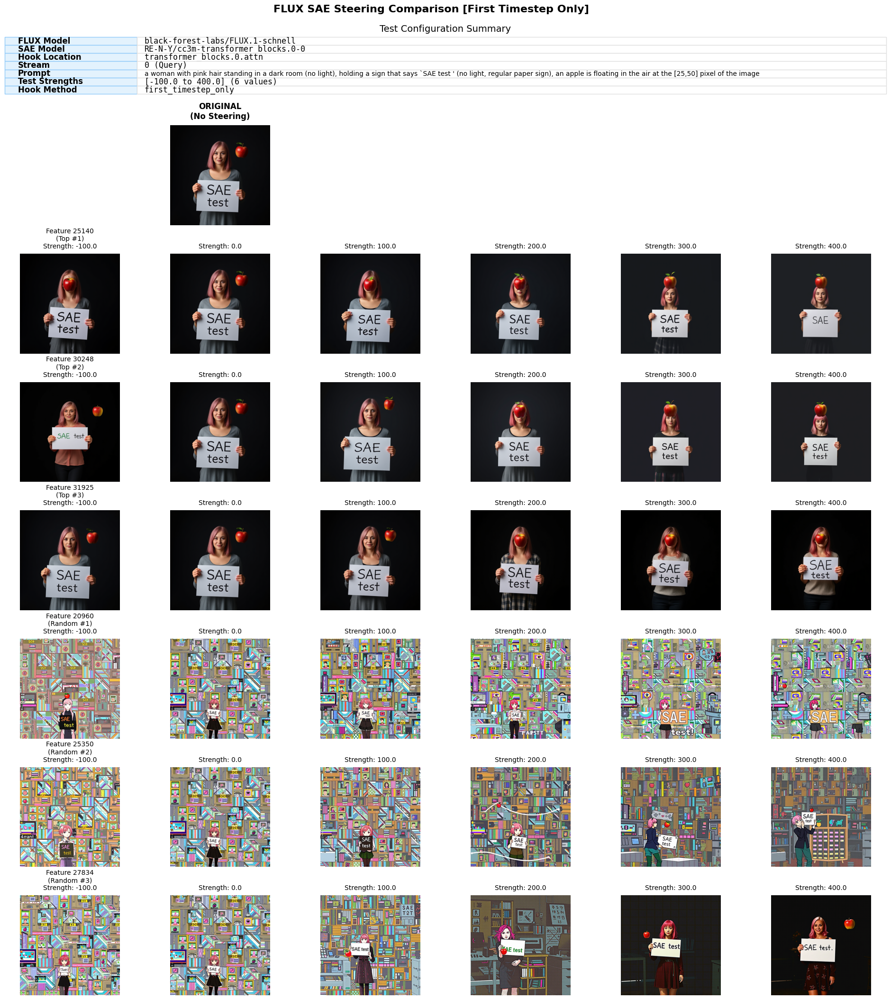


📂 Folder 2/2: steering_test_FLUX-1-schnell_transformer_blocks.0-0_surgery_16014404_strengths--100-to-400.0_all_timesteps
   Found 37 images | Hook variant: all_timesteps
   Strengths: [-100.0, 0.0, 100.0, 200.0, 300.0, 400.0]
   Top Features: 3 | Steered Features: 3
   ✅ Visualization saved: flux_steering_comparison_all_timesteps.png


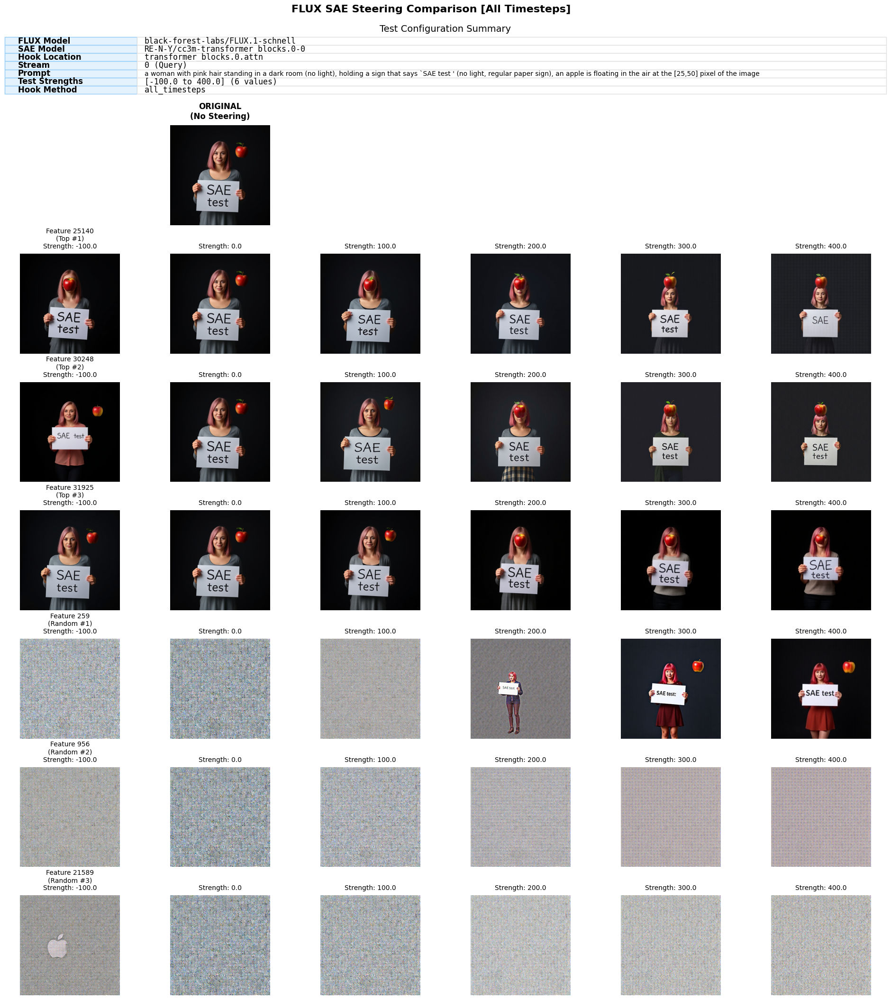


✅ Group 1 processing complete!

✅ All 1 groups processed successfully!


In [15]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from PIL import Image
import glob
import re
from collections import defaultdict

# ===== CONFIGURATION =====
output_base = Path("./output")

# Find all test folders (both hook_time variants)
if output_base.exists():
    all_test_folders = sorted(
        output_base.glob("steering_test_*"),
        key=lambda x: x.stat().st_mtime,
        reverse=False  # Process oldest first (ascending order)
    )
    
    # Group folders by their base name (without hook_time suffix)
    folder_groups = defaultdict(list)
    for folder in all_test_folders:
        folder_name = folder.name
        # Extract base name by removing hook_time suffix
        base_name = re.sub(r'_(all_timesteps|first_timestep_only)$', '', folder_name)
        folder_groups[base_name].append(folder)
    
    print(f"Found {len(all_test_folders)} test folders")
    print(f"Organized into {len(folder_groups)} test groups\n")
    
    # Process each group sequentially
    for group_idx, (base_name, folders) in enumerate(folder_groups.items()):
        print(f"\n{'='*80}")
        print(f"Processing Group {group_idx + 1}/{len(folder_groups)}: {base_name}")
        print(f"{'='*80}")
        
        # Sort folders within group: first_timestep_only first, then all_timesteps
        def sort_hook_time(f):
            if 'first_timestep_only' in f.name:
                return 0
            elif 'all_timesteps' in f.name:
                return 1
            else:
                return 2
        
        folders = sorted(folders, key=sort_hook_time)
        
        # Process each folder variant (first_timestep_only, then all_timesteps)
        for folder_idx, folder_path in enumerate(folders):
            print(f"\n📂 Folder {folder_idx + 1}/{len(folders)}: {folder_path.name}")
            
            # Extract hook_time variant
            if 'first_timestep_only' in folder_path.name:
                hook_time_variant = "first_timestep_only"
            elif 'all_timesteps' in folder_path.name:
                hook_time_variant = "all_timesteps"
            else:
                hook_time_variant = "unknown"
            
            # ===== FIND AND ORGANIZE IMAGES =====
            image_files = sorted(glob.glob(str(folder_path / "flux_*.png")))
            image_files = [f for f in image_files if not f.endswith('flux_steering_comparison.png')]
            
            print(f"   Found {len(image_files)} images | Hook variant: {hook_time_variant}")
            
            if len(image_files) == 0:
                print(f"   ⚠️  No images found in {folder_path.name}")
                continue
            
            # ===== EXTRACT CONFIGURATION =====
            config_info = {}
            
            try:
                import __main__
                namespace = __main__.__dict__
            except:
                namespace = globals()
            
            if 'FLUX_MODEL' in namespace:
                config_info['FLUX Model'] = namespace['FLUX_MODEL']
            elif 'FLUX_MODEL' in globals():
                config_info['FLUX Model'] = globals()['FLUX_MODEL']
            
            if 'SAE_MODEL' in namespace:
                config_info['SAE Model'] = namespace['SAE_MODEL']
            elif 'SAE_MODEL' in globals():
                config_info['SAE Model'] = globals()['SAE_MODEL']
            
            if 'prompt' in namespace:
                config_info['Prompt'] = namespace['prompt']
            elif 'prompt' in globals():
                config_info['Prompt'] = globals()['prompt']
            
            if 'test_strengths' in namespace:
                config_info['Test Strengths'] = namespace['test_strengths']
            elif 'test_strengths' in globals():
                config_info['Test Strengths'] = globals()['test_strengths']
            
            if 'hook_location' in namespace:
                config_info['Hook Location'] = namespace['hook_location']
            elif 'hook_location' in globals():
                config_info['Hook Location'] = globals()['hook_location']
            
            if 'stream' in namespace:
                config_info['Stream'] = namespace['stream']
            elif 'stream' in globals():
                config_info['Stream'] = globals()['stream']
            
            folder_name = folder_path.name
            if 'steering_test_' in folder_name:
                if 'FLUX Model' not in config_info or not config_info['FLUX Model']:
                    model_match = re.search(r'(FLUX-[^-]+-[^-]+)', folder_name)
                    if model_match:
                        config_info['FLUX Model'] = model_match.group(1).replace('-', '.')
                
                if 'SAE Model' not in config_info or not config_info['SAE Model']:
                    sae_match = re.search(r'(transformer_blocks\.\d+-\d+|single_transformer_blocks\.\d+)', folder_name)
                    if sae_match:
                        config_info['SAE Model'] = sae_match.group(1)
                
                if 'Test Strengths' not in config_info or not config_info['Test Strengths']:
                    strength_match = re.search(r'strengths-([\d.]+)-to-([\d.]+)', folder_name)
                    if strength_match:
                        min_str = float(strength_match.group(1))
                        max_str = float(strength_match.group(2))
                        config_info['Test Strengths'] = f"{min_str} to {max_str}"
            
            # ===== ORGANIZE IMAGES =====
            original_files = [f for f in image_files if "original" in f]
            top_feature_files = [f for f in image_files if "top_feature" in f]
            steered_feature_files = [f for f in image_files if "steered_feature" in f]
            
            def parse_image_name(filepath):
                """Extract feature_idx and strength from filename"""
                name = Path(filepath).stem
                parts = name.split("_")
                
                feat_idx = None
                strength = None
                
                for i, part in enumerate(parts):
                    if part == "feature" and i + 1 < len(parts):
                        try:
                            feat_idx = int(parts[i + 1])
                        except:
                            pass
                    if part == "strength" and i + 1 < len(parts):
                        try:
                            strength = float(parts[i + 1])
                        except:
                            pass
                
                return feat_idx, strength
            
            # Group top features by feature index, then sort by strength
            top_features_dict = defaultdict(list)
            for f in top_feature_files:
                feat_idx, strength = parse_image_name(f)
                if feat_idx is not None and strength is not None:
                    top_features_dict[feat_idx].append((strength, f))
            
            for feat_idx in top_features_dict:
                top_features_dict[feat_idx].sort(key=lambda x: x[0])
            
            # Group steered features by feature index, then sort by strength
            steered_features_dict = defaultdict(list)
            for f in steered_feature_files:
                feat_idx, strength = parse_image_name(f)
                if feat_idx is not None and strength is not None:
                    steered_features_dict[feat_idx].append((strength, f))
            
            for feat_idx in steered_features_dict:
                steered_features_dict[feat_idx].sort(key=lambda x: x[0])
            
            # Get all strengths
            all_strengths = set()
            for feat_dict in [top_features_dict, steered_features_dict]:
                for feat_idx in feat_dict:
                    for strength, _ in feat_dict[feat_idx]:
                        all_strengths.add(strength)
            all_strengths = sorted(list(all_strengths))
            
            print(f"   Strengths: {all_strengths}")
            print(f"   Top Features: {len(top_features_dict)} | Steered Features: {len(steered_features_dict)}")
            
            # ===== CREATE FIGURE =====
            n_strength_cols = len(all_strengths)
            n_top_features = len(top_features_dict)
            n_steered_features = len(steered_features_dict)
            n_rows = 1 + n_top_features + n_steered_features
            
            fig = plt.figure(figsize=(4 * n_strength_cols, 3 * n_rows + 2.5))
            gs = gridspec.GridSpec(n_rows + 1, n_strength_cols, figure=fig, hspace=0.3, wspace=0.15,
                                   height_ratios=[0.6] + [1] * n_rows)
            
            # ===== CREATE SUMMARY TABLE AT TOP =====
            ax_table = fig.add_subplot(gs[0, :])
            ax_table.axis('off')
            
            table_data = []
            fields = []
            
            if config_info.get('FLUX Model'):
                fields.append(('FLUX Model', config_info['FLUX Model']))
            if config_info.get('SAE Model'):
                fields.append(('SAE Model', config_info['SAE Model']))
            if config_info.get('Hook Location'):
                fields.append(('Hook Location', config_info['Hook Location']))
            if config_info.get('Stream') is not None:
                fields.append(('Stream', f"{config_info['Stream']} ({'Query' if config_info['Stream'] == 0 else 'Key'})"))
            
            prompt_text = config_info.get('Prompt')
            if prompt_text:
                fields.append(('Prompt', prompt_text))
            
            strengths = config_info.get('Test Strengths')
            if strengths:
                if isinstance(strengths, list):
                    strengths_str = f"[{min(strengths):.1f} to {max(strengths):.1f}] ({len(strengths)} values)"
                else:
                    strengths_str = str(strengths)
                fields.append(('Test Strengths', strengths_str))
            
            # Add hook time variant
            fields.append(('Hook Method', hook_time_variant))
            
            if fields:
                for field_name, field_value in fields:
                    table_data.append([field_name, str(field_value) if field_value else 'N/A'])
                
                table = ax_table.table(cellText=table_data,
                                       cellLoc='left',
                                       colWidths=[0.15, 0.85],
                                       loc='center',
                                       bbox=[0, 0.05, 1, 0.95])
                
                table.auto_set_font_size(False)
                table.set_fontsize(10)
                table.scale(1, 3.0)
                
                for i in range(len(table_data)):
                    field_name = str(table_data[i][0])
                    is_prompt = 'Prompt' in field_name
                    
                    table[(i, 0)].set_text_props(weight='bold', fontsize=12)
                    table[(i, 0)].get_text().set_ha('left')
                    table[(i, 0)].set_facecolor('#e3f2fd')
                    table[(i, 0)].set_edgecolor('#90caf9')
                    
                    if is_prompt:
                        table[(i, 1)].set_text_props(fontsize=10, family='sans-serif')
                    else:
                        table[(i, 1)].set_text_props(fontsize=12, family='monospace')
                    
                    table[(i, 1)].get_text().set_ha('left')
                    table[(i, 1)].set_facecolor('#ffffff')
                    table[(i, 1)].set_edgecolor('#e0e0e0')
                    table[(i, 1)].PAD = 0.01
                    table[(i, 1)].set_height(0.15)
                    table[(i, 0)].set_height(0.15)
                
                ax_table.set_title('Test Configuration Summary', fontsize=14, pad=8)
            
            # ===== ROW 0: ORIGINAL IMAGE =====
            if original_files:
                original_img_path = original_files[0]
                ax = fig.add_subplot(gs[1, 0:max(1, n_strength_cols // 2)])
                
                img = Image.open(original_img_path)
                ax.imshow(img)
                ax.axis('off')
                
                ax.set_title('ORIGINAL\n(No Steering)', fontsize=12, fontweight='bold', pad=10)
                for spine in ax.spines.values():
                    spine.set_edgecolor('green')
                    spine.set_linewidth(3)
                ax.set_facecolor('#e8f5e9')
                
                for col in range(max(1, n_strength_cols // 2), n_strength_cols):
                    ax_hide = fig.add_subplot(gs[1, col])
                    ax_hide.axis('off')
                
                current_row = 2
            else:
                current_row = 1
            
            # ===== TOP FEATURES ROWS =====
            top_feat_indices = sorted(top_features_dict.keys())
            for row_idx, feat_idx in enumerate(top_feat_indices):
                row = current_row + row_idx
                
                for col_idx, strength in enumerate(all_strengths):
                    ax = fig.add_subplot(gs[row, col_idx])
                    
                    img_path = None
                    for s, path in top_features_dict[feat_idx]:
                        if abs(s - strength) < 1e-6:
                            img_path = path
                            break
                    
                    if img_path and Path(img_path).exists():
                        img = Image.open(img_path)
                        ax.imshow(img)
                    else:
                        ax.text(0.5, 0.5, 'Missing', ha='center', va='center', fontsize=10, color='red')
                    
                    ax.axis('off')
                    
                    if col_idx == 0:
                        title = f"Feature {feat_idx}\n(Top #{row_idx + 1})"
                    else:
                        title = ""
                    
                    strength_title = f"Strength: {strength:.1f}"
                    full_title = f"{title}\n{strength_title}" if title else strength_title
                    
                    ax.set_title(full_title, fontsize=10, pad=8)
                    ax.set_facecolor('#e3f2fd')
            
            current_row += n_top_features
            
            # ===== STEERED FEATURES ROWS =====
            steered_feat_indices = sorted(steered_features_dict.keys())
            for row_idx, feat_idx in enumerate(steered_feat_indices):
                row = current_row + row_idx
                
                for col_idx, strength in enumerate(all_strengths):
                    ax = fig.add_subplot(gs[row, col_idx])
                    
                    img_path = None
                    for s, path in steered_features_dict[feat_idx]:
                        if abs(s - strength) < 1e-6:
                            img_path = path
                            break
                    
                    if img_path and Path(img_path).exists():
                        img = Image.open(img_path)
                        ax.imshow(img)
                    else:
                        ax.text(0.5, 0.5, 'Missing', ha='center', va='center', fontsize=10, color='red')
                    
                    ax.axis('off')
                    
                    if col_idx == 0:
                        title = f"Feature {feat_idx}\n(Random #{row_idx + 1})"
                    else:
                        title = ""
                    
                    strength_title = f"Strength: {strength:.1f}"
                    full_title = f"{title}\n{strength_title}" if title else strength_title
                    
                    ax.set_title(full_title, fontsize=10, pad=8)
                    ax.set_facecolor('#fff3e0')
            
            # ===== SAVE AND DISPLAY =====
            suptitle = f'FLUX SAE Steering Comparison [{hook_time_variant.replace("_", " ").title()}]'
            plt.suptitle(suptitle, fontsize=16, fontweight='bold', y=0.999)
            
            plt.tight_layout(rect=[0, 0, 1, 0.98])
            fig.subplots_adjust(top=0.97)
            
            # Save with hook_time in filename
            comparison_path = folder_path / f'flux_steering_comparison_{hook_time_variant}.png'
            plt.savefig(comparison_path, dpi=150, bbox_inches='tight', facecolor='white')
            print(f"   ✅ Visualization saved: {comparison_path.name}")
            
            plt.show()
            plt.close(fig)
        
        print(f"\n✅ Group {group_idx + 1} processing complete!")
    
    print(f"\n{'='*80}")
    print(f"✅ All {len(folder_groups)} groups processed successfully!")
    print(f"{'='*80}")

else:
    print("Output directory ./output/ not found! Run the steering cell first.")